In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Глобальное окружение

## Подгрузим данные

In [2]:
os.listdir('../data/anndata_objects/chimp')

['chimp.h5ad',
 'chimp_11454.h5ad',
 'chimp_13302.h5ad',
 'chimp_13309.h5ad',
 'chimp_j11.h5ad',
 'chimp_j8.h5ad']

In [3]:
adata = sc.read_h5ad('../data/anndata_objects/chimp/chimp.h5ad')
adata.obs_names_make_unique()
adata

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 22088 × 25080
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types'
    uns: 'spatial'
    obsm: 'spatial'

Посмотрим есть ли неразмеченые споты

In [4]:
adata.obs.label.isna().value_counts()

False    22086
True         2
Name: label, dtype: int64

In [5]:
adata.obs.label.value_counts()

WM             6397
L6             4710
L3             3400
L5             2870
Empty spots    1726
L4             1429
L1             1024
L2              530
Name: label, dtype: int64

In [6]:
samples = list(adata.uns['spatial'].keys())
samples

['chimp_11454', 'chimp_13302', 'chimp_13309', 'chimp_j11', 'chimp_j8']

## Посмотрим на изображения

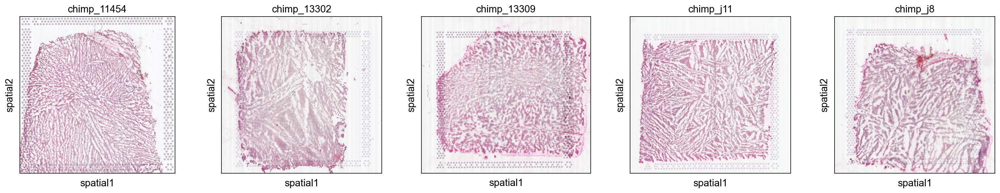

In [7]:
sq.pl.spatial_scatter(adata, library_key='sample_id', title=samples, ncols=5)

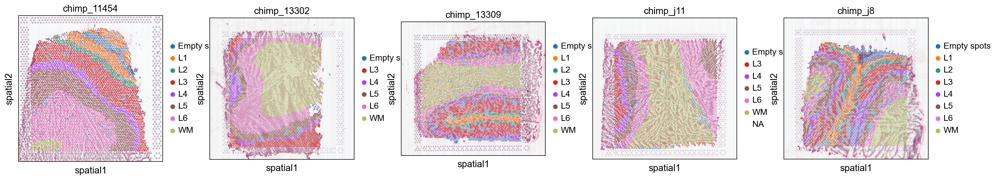

In [8]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', ncols=5, title=samples)

## Посмотрим на метрики

In [9]:
# add info on mitochondrial and hemoglobin genes to the objects.
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

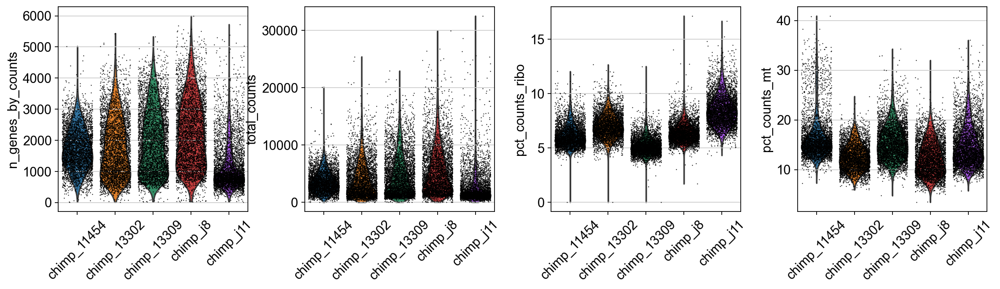

In [10]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt'],
             jitter=0.4, groupby = 'sample_id', rotation= 45)

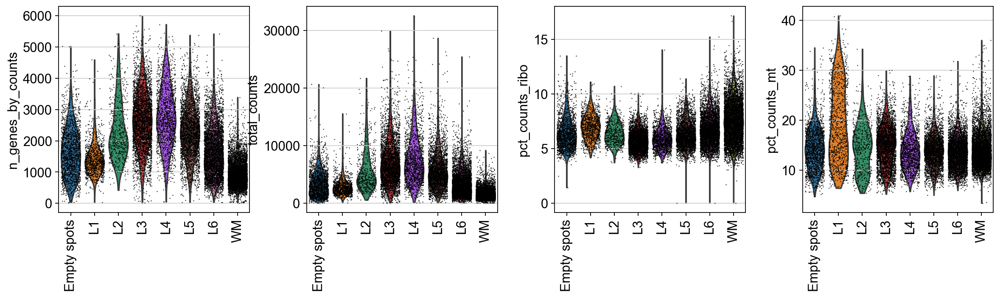

In [11]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt'],
             jitter=0.4, groupby = 'label', rotation= 90)

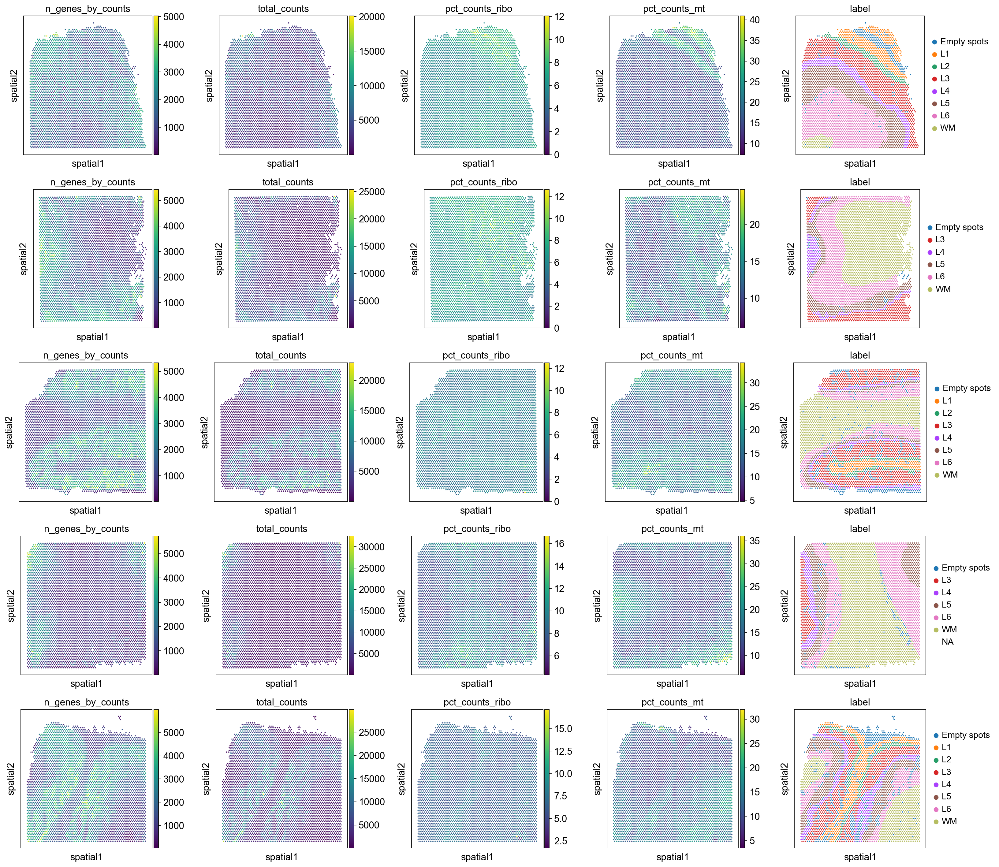

In [12]:
sq.pl.spatial_scatter(adata,
                      color=['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'label'],
                      library_key='sample_id', ncols=5, img=False)

## PCA

In [13]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:02:06)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


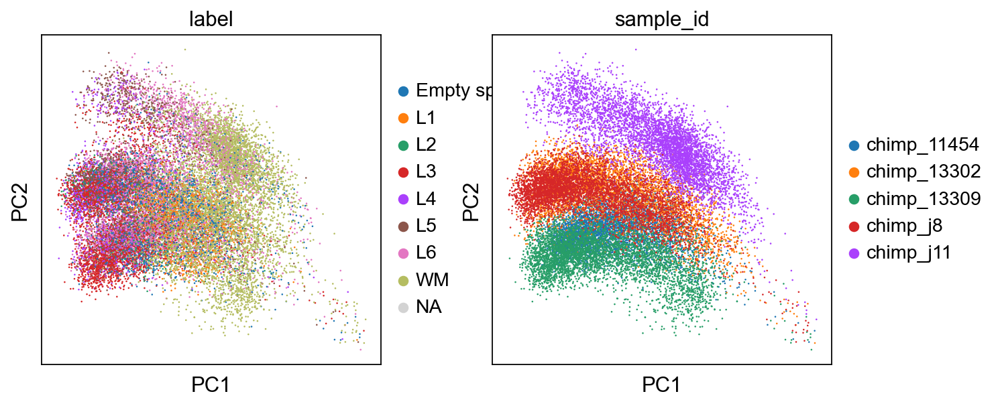

In [14]:
sc.pl.pca(adata, 
          color=['label', 'sample_id'],
          ncols=2, show=True)